In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
from scipy.interpolate import interp1d
import matplotlib.cm as cm
from salishsea_tools import (nc_tools, gsw_calls, geo_tools, viz_tools)
import seabird
import cmocean as cmo
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LightSource

import matplotlib as mpl

In [2]:
bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

mesh_mask = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/mesh_mask.nc')

mbathy = mesh_mask['mbathy'][0,...]

Z = bathy.variables['Bathymetry'][:]

y_wcvi_slice = np.arange(180,350)
x_wcvi_slice = np.arange(480,650)

zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]


lon_wcvi  = lon[180:350,480:650]
lat_wcvi  = lat[180:350,480:650]


NEP_aug = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/NEP36_T_S_Spice_aug_larger_offshore.nc')


sal_aug = NEP_aug.variables['vosaline']
temp_aug = NEP_aug.variables['votemper']
spic_aug = NEP_aug.variables['spiciness']
rho_aug = NEP_aug.variables['density']

zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht']


NEP_jul = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/NEP36_T_S_Spice_july_larger_offshore.nc')


sal_jul  = NEP_jul.variables['vosaline']
temp_jul = NEP_jul.variables['votemper']
spic_jul = NEP_jul.variables['spiciness']
rho_jul = NEP_jul.variables['density']

NEP_jun = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/NEP36_T_S_Spice_june_larger_offshore.nc')


sal_jun  = NEP_jun.variables['vosaline']
temp_jun = NEP_jun.variables['votemper']
spic_jun = NEP_jun.variables['spiciness']
rho_jun = NEP_jun.variables['density']


# NEP_iso_jul = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/short_slice_NEP36_jul_along_isopycnal_larger_offshore.nc')

# spic_iso_jul = NEP_iso_jul.variables['spiciness']
# iso_t = NEP_iso_jul.variables['isot']

short_NEP_iso_jul = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/short_slice_NEP36_jul_along_isopycnal_larger_offshore.nc')

short_spic_iso_jul = short_NEP_iso_jul.variables['spiciness']
short_iso_t = short_NEP_iso_jul.variables['isot']


short_NEP_iso_aug = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/short_NEP36_aug_along_isopycnal_larger_offahore.nc')

short_spic_iso_aug = short_NEP_iso_aug.variables['spiciness']
short_iso_t = short_NEP_iso_aug.variables['isot']


short_NEP_iso_jun = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/short_NEP36_june_along_isopycnal_larger_offshore.nc')

short_spic_iso_jun = short_NEP_iso_jun.variables['spiciness']
short_iso_t = short_NEP_iso_jun.variables['isot']



In [3]:
def plot_iso_den(t, rho_0, month):
    
    
    if month == 'June':
    
        depth_rho_0 = np.zeros_like(sal_jun[0,0,...])

        SPICE_on_rho_0 = np.zeros_like(depth_rho_0)

        for j in np.arange(180,350):
            for i in np.arange(480,650):
                if mbathy[j,i] > 0:
                    depth_rho_0[j, i] = np.interp(rho_0, rho_jun[t,:mbathy[j, i], j, i]-1000, zlevels[:mbathy[j, i]])
                    
                    
        k = np.where(short_iso_t[:] == rho_0)
    
        spic_tzyx = short_spic_iso_jun[t,k[0],...]
        spic_tzyx[np.isnan(spic_tzyx)] = 0
        spic_iso = np.ma.masked_equal(spic_tzyx[0,...], 0)
    
    if month == 'July':
    
        depth_rho_0 = np.zeros_like(sal_jul[0,0,...])

        SPICE_on_rho_0 = np.zeros_like(depth_rho_0)

        for j in np.arange(180,350):
            for i in np.arange(480,650):
                if mbathy[j,i] > 0:
                    depth_rho_0[j, i] = np.interp(rho_0, rho_jul[t,:mbathy[j, i], j, i]-1000, zlevels[:mbathy[j, i]])
                    
                    
        k = np.where(short_iso_t[:] == rho_0)
    
        spic_tzyx = short_spic_iso_jul[t,k[0],...]
        spic_tzyx[np.isnan(spic_tzyx)] = 0
        spic_iso = np.ma.masked_equal(spic_tzyx[0,...], 0)
                    
    if month == 'August':
    
        depth_rho_0 = np.zeros_like(sal_aug[0,0,...])

        SPICE_on_rho_0 = np.zeros_like(depth_rho_0)

        for j in np.arange(180,350):
            for i in np.arange(480,650):
                if mbathy[j,i] > 0:
                    depth_rho_0[j, i] = np.interp(rho_0, rho_aug[t,:mbathy[j, i], j, i]-1000, zlevels[:mbathy[j, i]])

                    
        k = np.where(short_iso_t[:] == rho_0)
    
        spic_tzyx = short_spic_iso_aug[t,k[0],...]
        spic_tzyx[np.isnan(spic_tzyx)] = 0
        spic_iso = np.ma.masked_equal(spic_tzyx[0,...], 0)


#     norm = mpl.colors.Normalize(vmin=-0.4,vmax=-0.05)
    norm = mpl.colors.Normalize(vmin=-0.2,vmax=-0.05)


    plt.rcParams['contour.negative_linestyle'] = 'solid' # default is to have negative contours with dashed lines
    plt.rcParams.update({'font.size':16})

    


    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('Burlywood')

    V_normalized = (spic_iso - spic_iso.min().min())
    V_normalized = V_normalized / V_normalized.max().max()
    spic_plot = V_normalized


    ls = LightSource(290, 35)
#     cmap1 = ls.shade(spic_iso, cmap=cmap, vert_exag=0.8, vmin=-0.4, vmax =-0.15, blend_mode='overlay')

    cmap1 = ls.shade(spic_iso, cmap=cmap, vert_exag=0.8, vmin=-0.2, vmax =-0.05, blend_mode='overlay')




    fig = plt.figure(figsize=(25, 20))
    ax = fig.gca(projection='3d')
    
    if month == 'June':
        
        ax.set_title('Spiciness on {0} June 2015, at isopycnal level of \u2248 {d:.2f} '.format(t+1, d=rho_0))
    
    if month == 'July':
        
        ax.set_title('Spiciness on {0} July 2015, at isopycnal level of \u2248 {d:.2f} '.format(t+1, d=rho_0))
        
    if month == 'August':
        
        ax.set_title('Spiciness on {0} August 2015, at isopycnal level of \u2248 {d:.2f} '.format(t+1, d=rho_0))
        
    X, Y = np.meshgrid(x_wcvi_slice[:],y_wcvi_slice[:])
#     surf = ax.plot_surface(np.flip(Y, axis=0), X, -depth_rho_0[180:350,480:650], facecolors=cmap1,linewidth=0, antialiased=False, rstride=1, cstride=1)
    surf = ax.plot_surface(lon_wcvi, lat_wcvi,-depth_rho_0[180:350,480:650], facecolors=cmap1, linewidth=0, antialiased=False, rstride=1, cstride=1)
    VecStart_x = lon[264, 599]
    VecStart_y = lat[264, 599]
    VecStart_z = 0
    VecEnd_x = lon[264, 599]
    VecEnd_y = lat[264, 599]
    VecEnd_z  =-200
#     i = 0
    ax.plot(xs = np.array([VecStart_x, VecEnd_x], dtype=float), ys  = np.array([VecStart_y, VecEnd_y], dtype=float), zs=np.array([VecStart_z, VecEnd_z], dtype=float))
    ax.set_aspect('auto')
#     ax.view_init(35, 300) # elevation and azimuth

    ax.set_ylabel('Latitude', fontsize = 18, labelpad= 18)
    ax.set_xlabel('Longitude', fontsize = 18, labelpad= 18)
    ax.set_zlabel('Depth (m)', fontsize = 18, labelpad= 18)
    ax.set_zlim(-230,0)
    m = cm.ScalarMappable(cmap=plt.get_cmap(cmo.cm.balance))
    m.set_array(spic_iso)
#     m.set_clim(-0.4, -0.05)
    m.set_clim(-0.2, -0.05)
    plt.colorbar(m)
    ax.set_aspect('auto')

    ax.view_init(35, 240) # elevation and azimuth

#     ax.set_ylabel('X index')
#     ax.set_xlabel('Y index')
#     ax.set_zlabel('Depth (m)')


In [4]:
VecStart_x = lon[264, 599]
VecStart_y = lat[264, 599]
VecStart_z = 0
VecEnd_x = lon[264, 599]
VecEnd_y = lat[264, 599]
VecEnd_z  =-200

In [30]:
xs = np.array([VecStart_x, VecEnd_x], dtype=float)

In [35]:
xs

array([-125.47129059, -125.47129059])

In [36]:
ys  = np.array([VecStart_y, VecEnd_y], dtype=float)

In [38]:
ys

(2,)

In [46]:
zs=np.array([VecStart_z, VecEnd_z], dtype=float)

In [47]:
zs.shape

(2, 1)

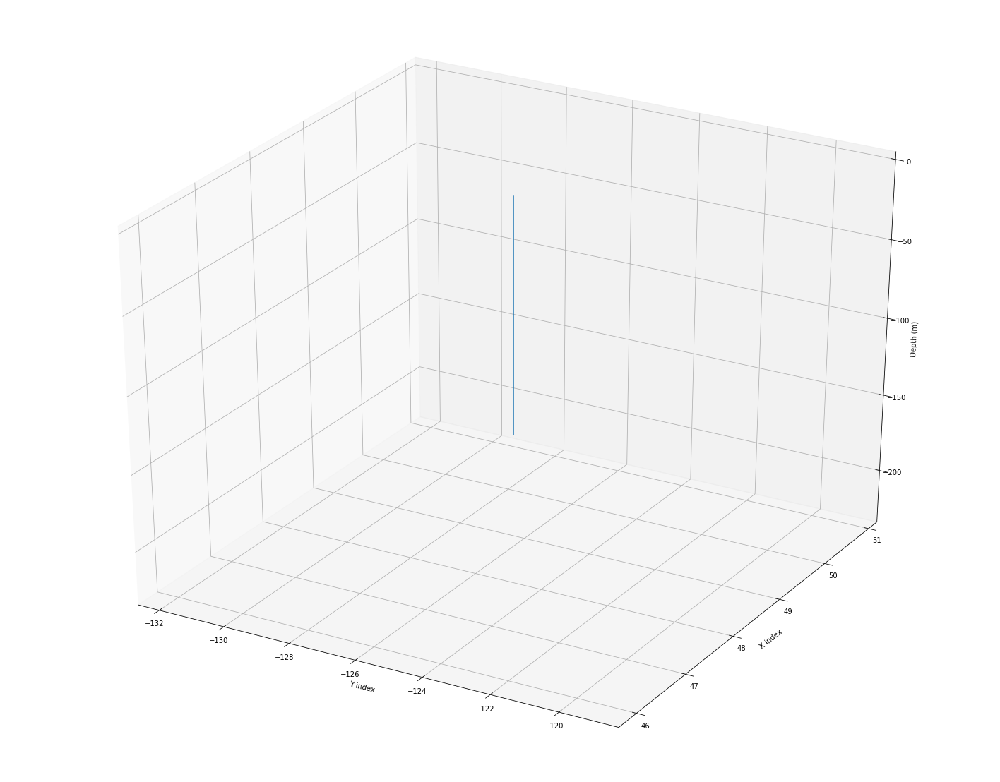

In [6]:
fig = plt.figure(figsize=(25, 20))
ax = fig.gca(projection='3d')

X, Y = np.meshgrid(x_wcvi_slice[:],y_wcvi_slice[:])
#     surf = ax.plot_surface(np.flip(Y, axis=0), X, -depth_rho_0[180:350,480:650], facecolors=cmap1,linewidth=0, antialiased=False, rstride=1, cstride=1)
#     surf = ax.plot_surface(lon_wcvi, lat_wcvi,-depth_rho_0[180:350,480:650], facecolors=cmap1, linewidth=0, antialiased=False, rstride=1, cstride=1)
VecStart_x = lon[264, 599]
VecStart_y = lat[264, 599]
VecStart_z = 0
VecEnd_x = lon[264, 599]
VecEnd_y = lat[264, 599]
VecEnd_z  =-150
i = 0
# ax.scatter([VecStart_x, VecEnd_x], [VecStart_y,VecEnd_y], zs=[VecStart_z, VecEnd_z], marker = '*', s = 200)
ax.plot(xs = np.array([VecStart_x, VecEnd_x], dtype=float), ys  = np.array([VecStart_y, VecEnd_y], dtype=float), zs=np.array([VecStart_z, VecEnd_z], dtype=float))
ax.set_aspect('auto')
# ax.view_init(35, 300) # elevation and azimuth

ax.set_ylabel('X index')
ax.set_xlabel('Y index')
ax.set_zlabel('Depth (m)')
ax.set_zlim(-230,0)
# m = cm.ScalarMappable(cmap=plt.get_cmap(cmo.cm.balance))
# m.set_array(spic_iso)
#     m.set_clim(-0.4, -0.05)
# m.set_clim(-0.2, -0.05)
# plt.colorbar(m)
ax.set_aspect('auto')

# ax.view_init(25, 240) # elevation and azimuth

ax.set_ylabel('X index')
ax.set_xlabel('Y index')
ax.set_zlabel('Depth (m)')


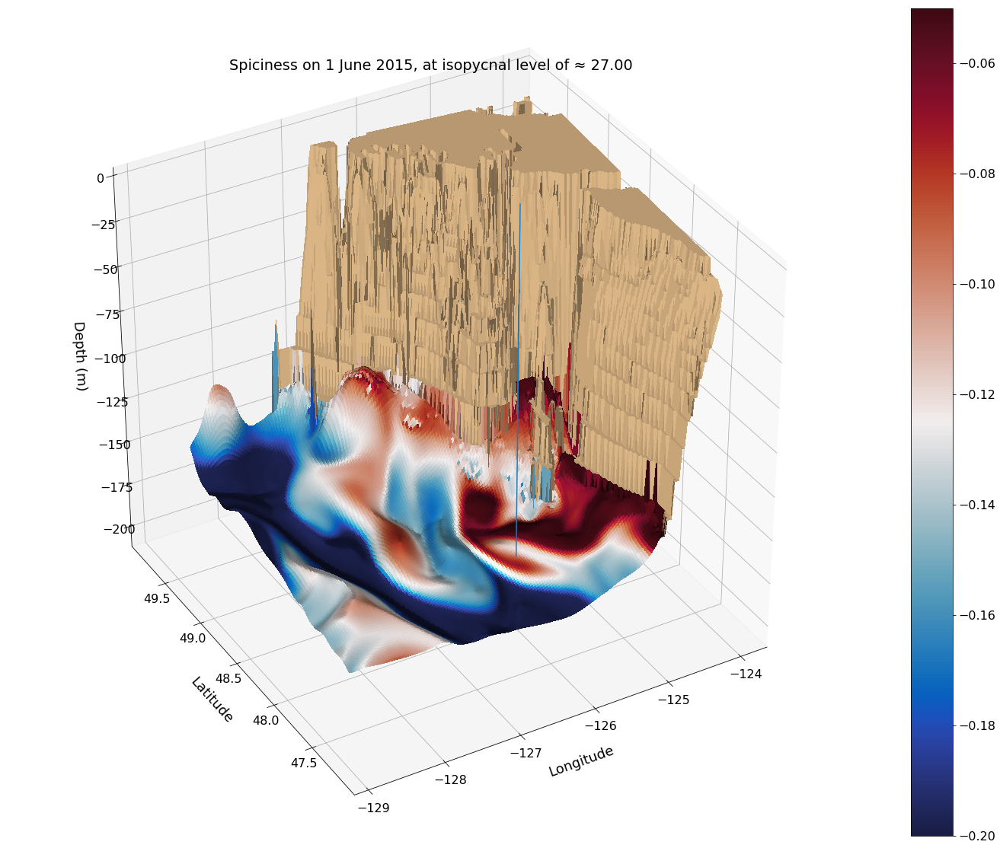

In [31]:
t= 0
rho_0 = 27

plot_iso_den(t, rho_0, 'June')

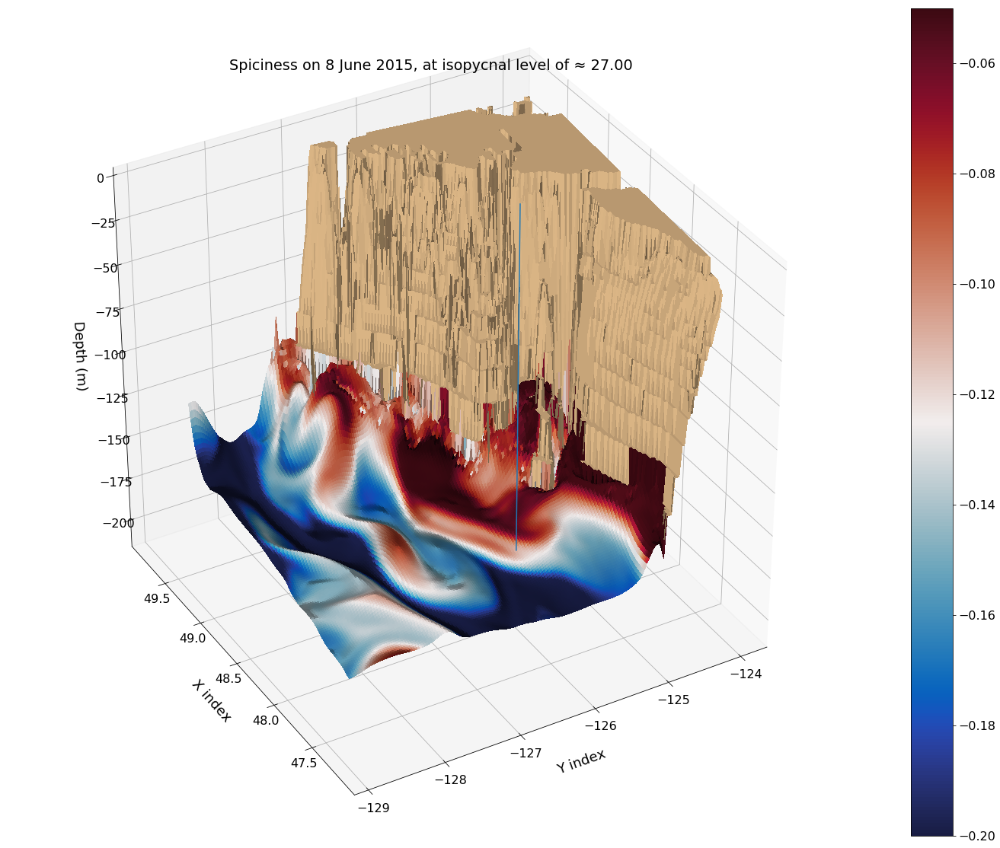

In [17]:
t= 7
rho_0 = 27

plot_iso_den(t, rho_0, 'June')

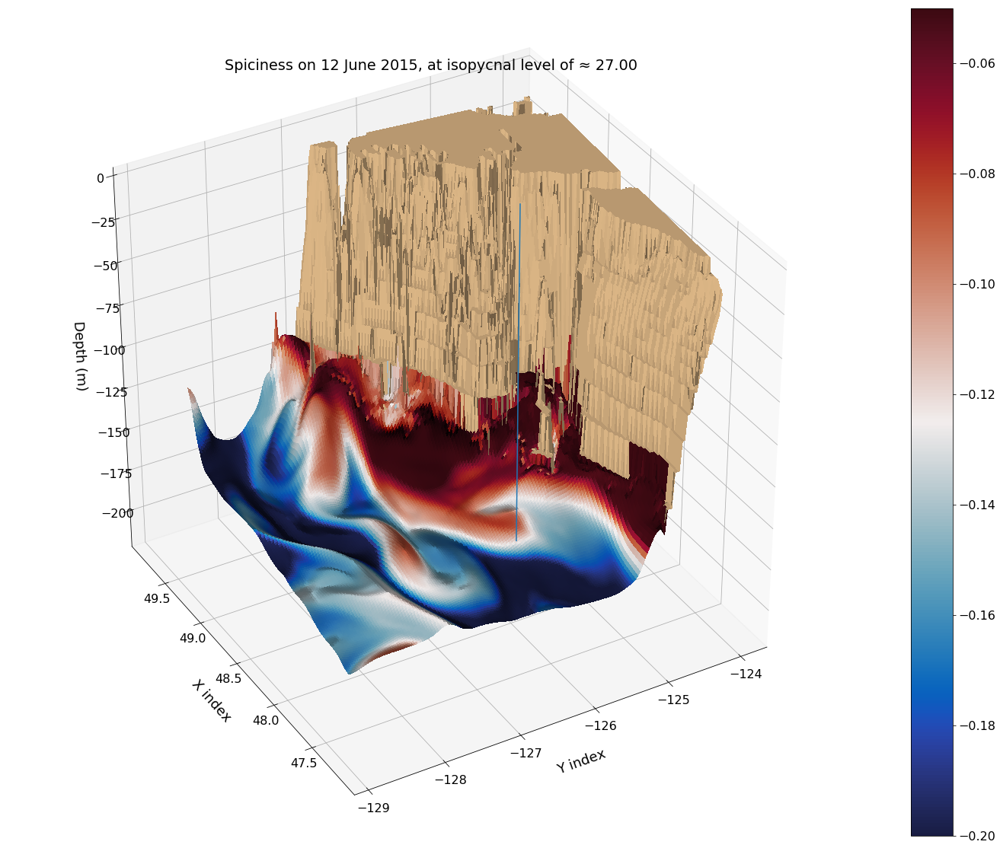

In [18]:
t= 11
rho_0 = 27

plot_iso_den(t, rho_0, 'June')

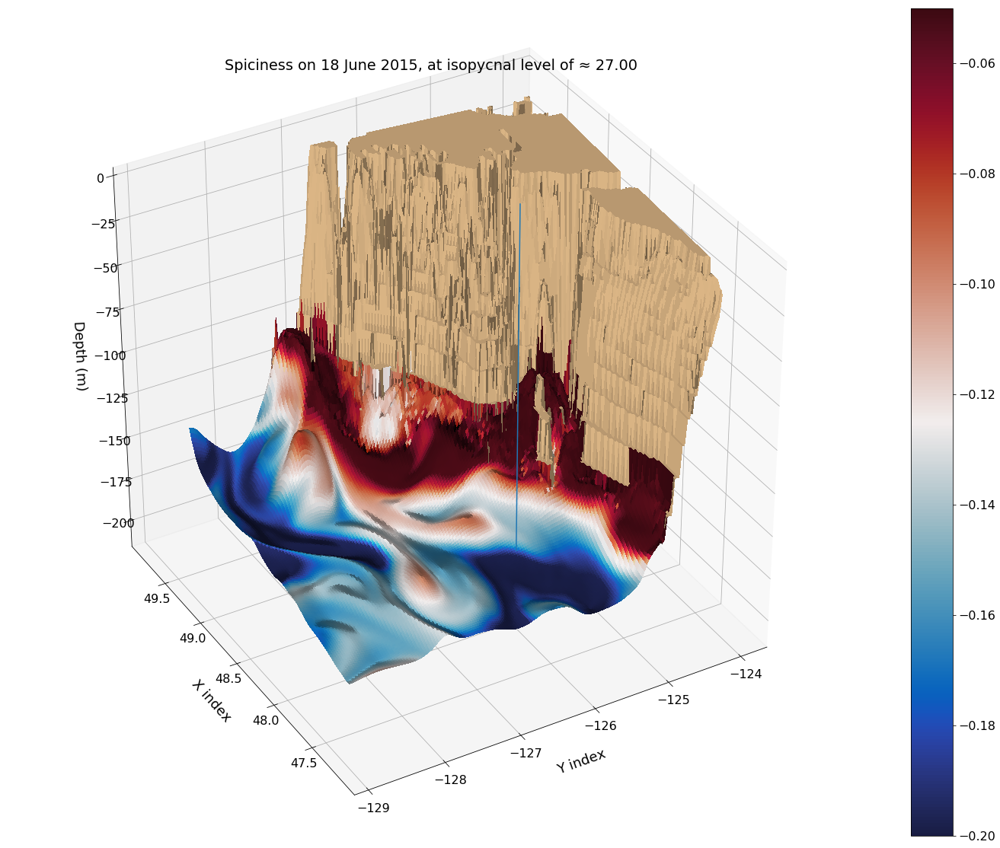

In [19]:
t= 17
rho_0 = 27

plot_iso_den(t, rho_0, 'June')

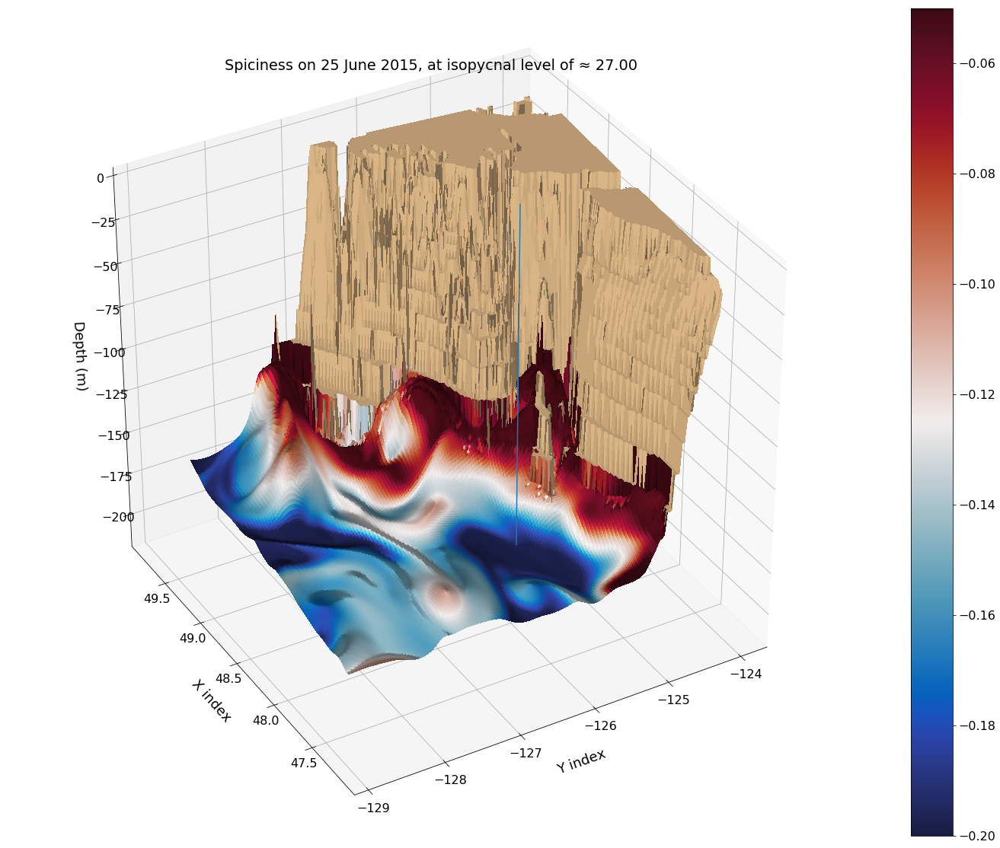

In [20]:
t= 24
rho_0 = 27

plot_iso_den(t, rho_0, 'June')

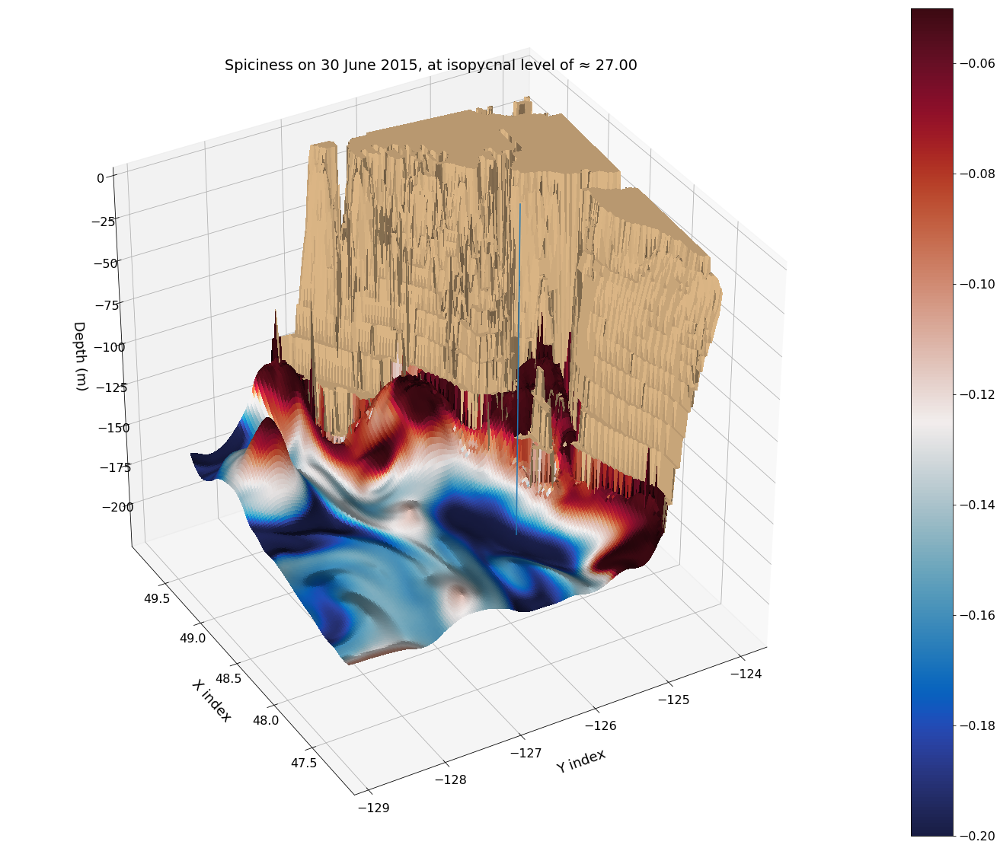

In [21]:
t= 29
rho_0 = 27

plot_iso_den(t, rho_0, 'June')

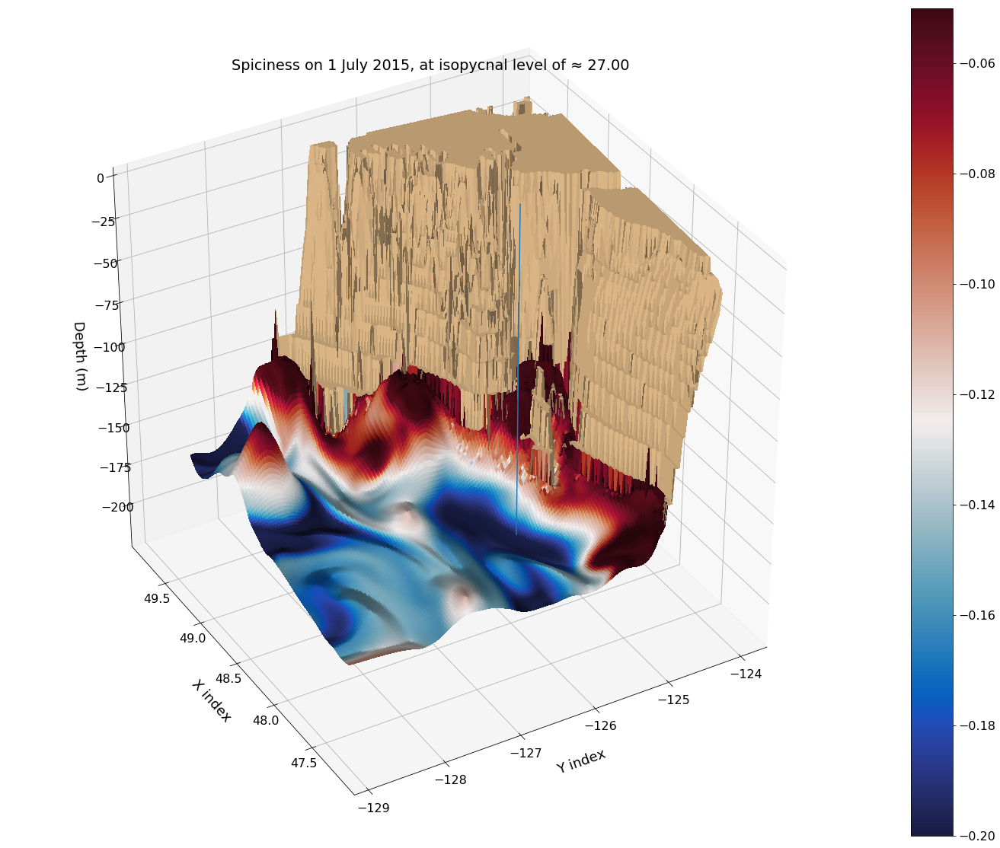

In [22]:
t= 0
rho_0 = 27

plot_iso_den(t, rho_0, 'July')

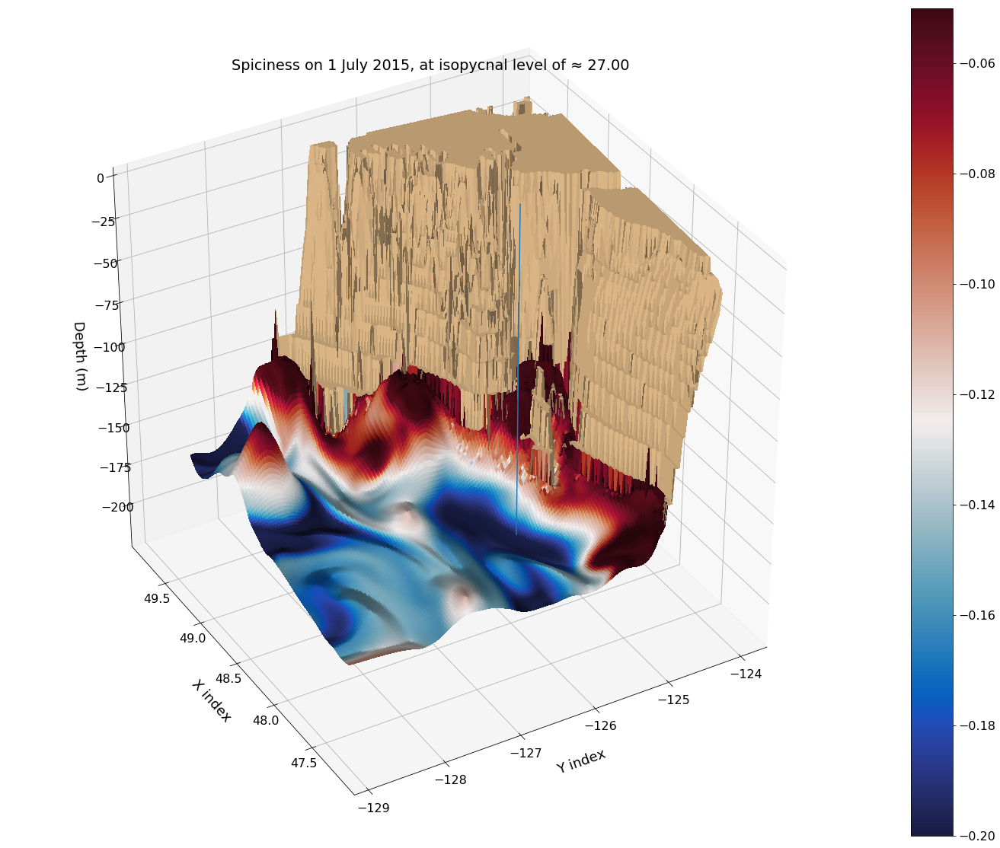

In [23]:
t= 0
rho_0 = 27

plot_iso_den(t, rho_0, 'July')

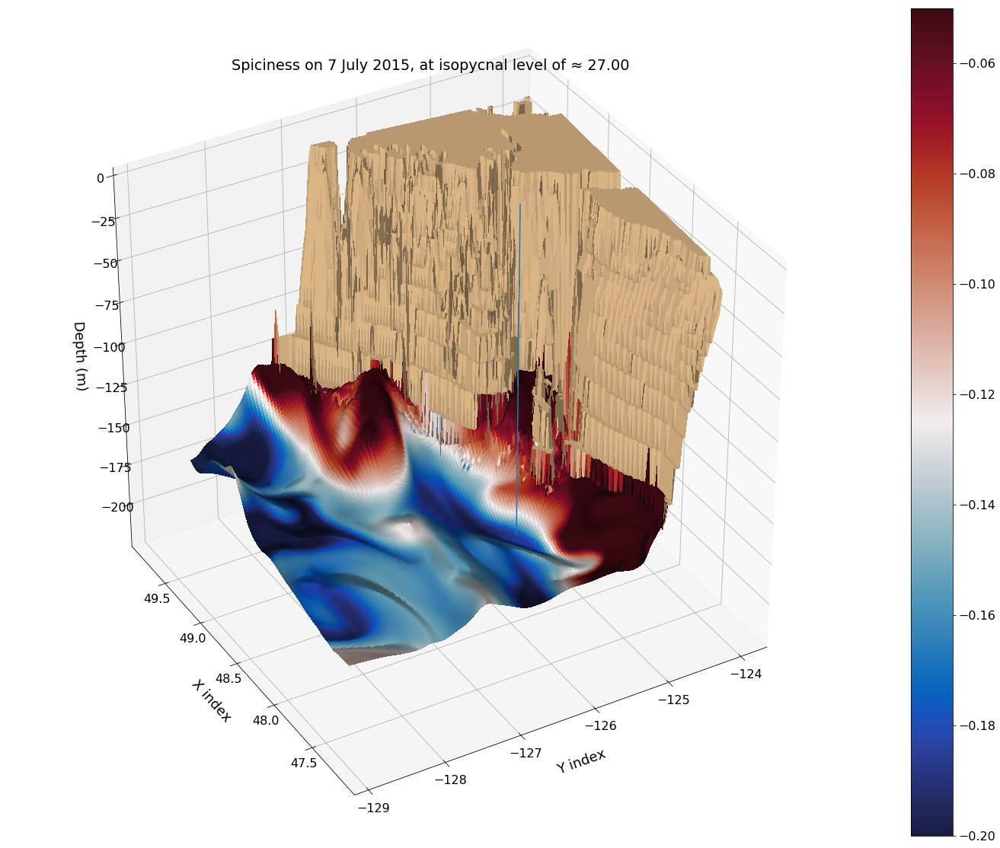

In [24]:
t= 6
rho_0 = 27

plot_iso_den(t, rho_0, 'July')

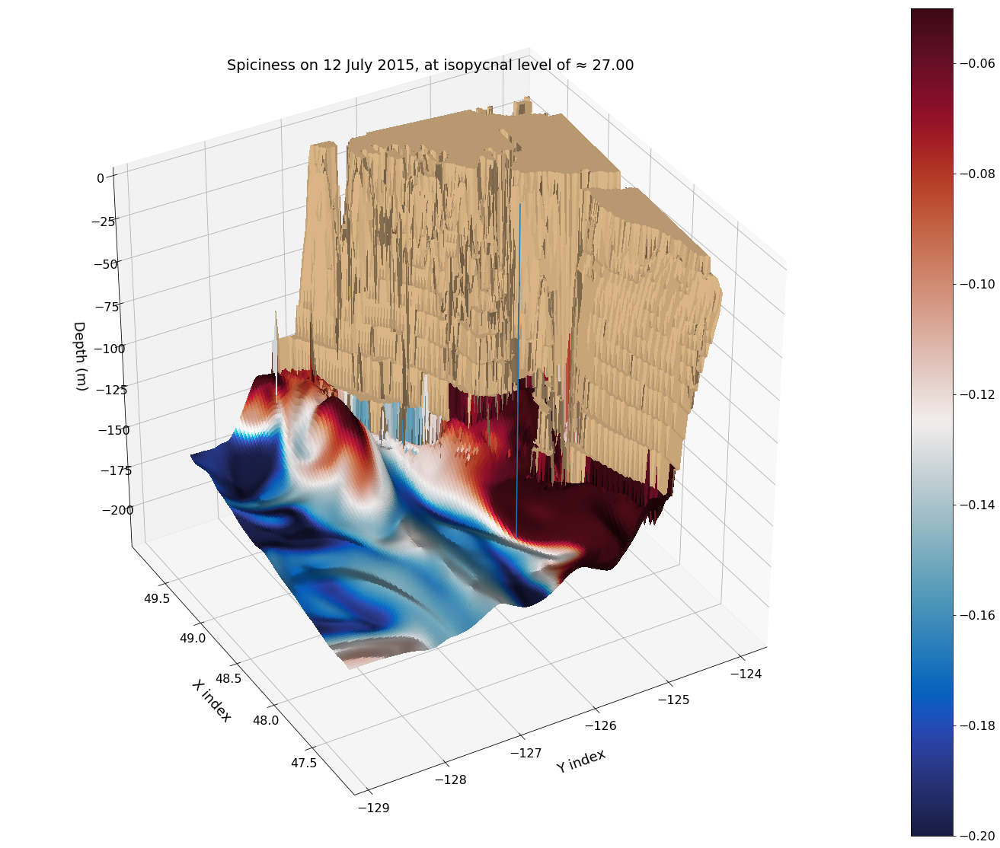

In [25]:
t= 11
rho_0 = 27

plot_iso_den(t, rho_0, 'July')

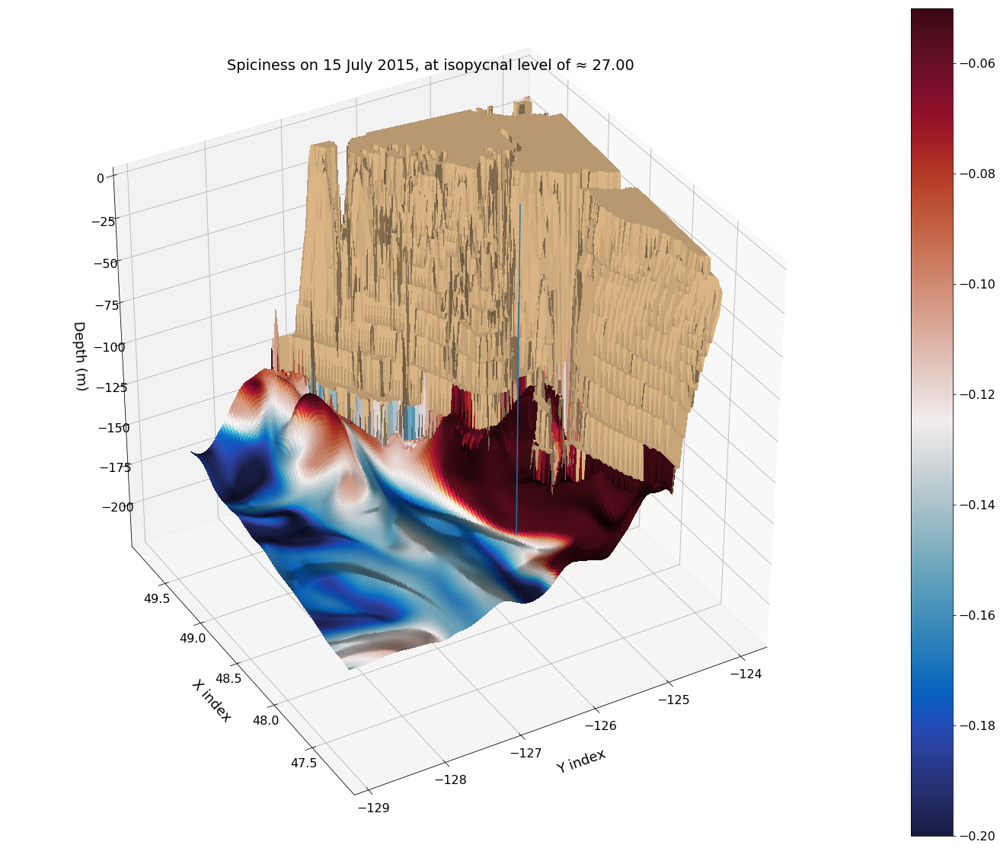

In [26]:
t= 14
rho_0 = 27

plot_iso_den(t, rho_0, 'July')

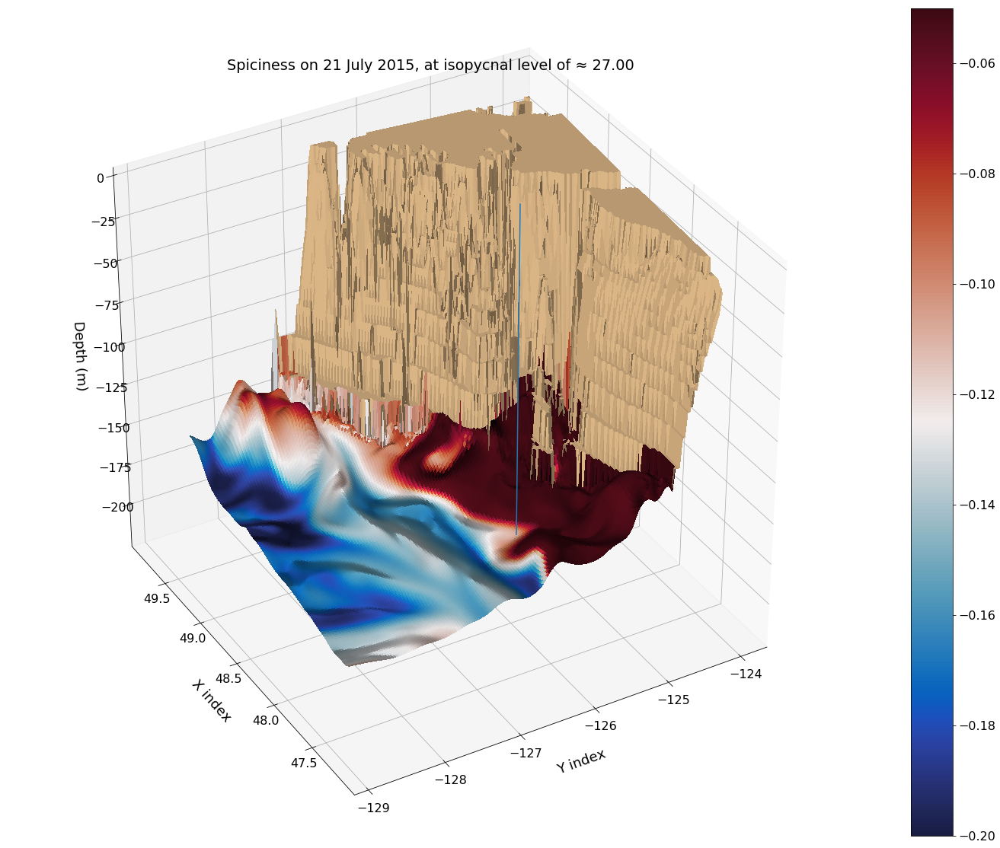

In [27]:
t= 20
rho_0 = 27

plot_iso_den(t, rho_0, 'July')

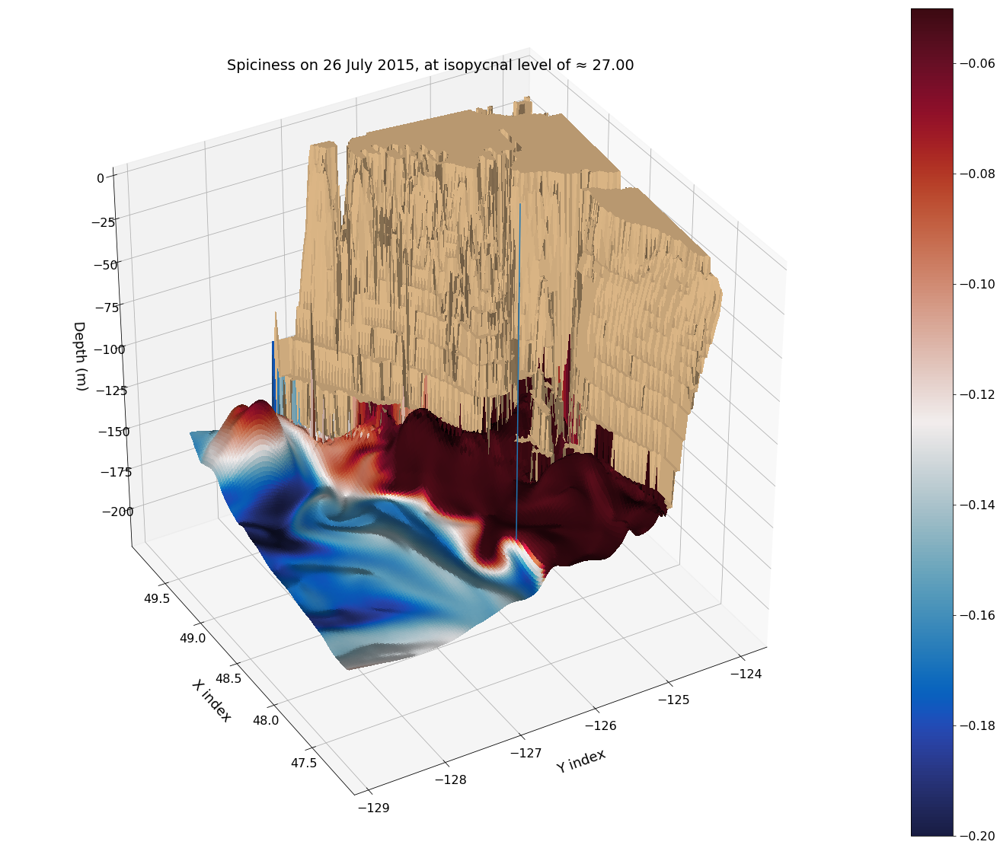

In [28]:
t= 25
rho_0 = 27

plot_iso_den(t, rho_0, 'July')

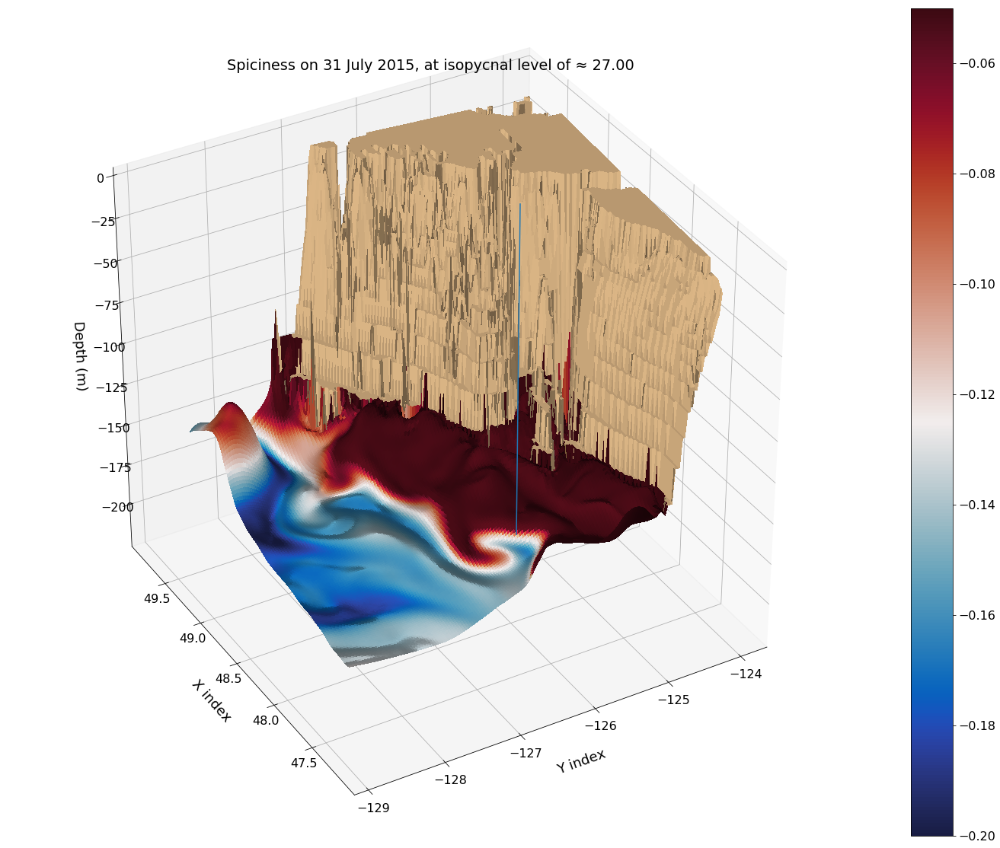

In [29]:
t= 30
rho_0 = 27

plot_iso_den(t, rho_0, 'July')

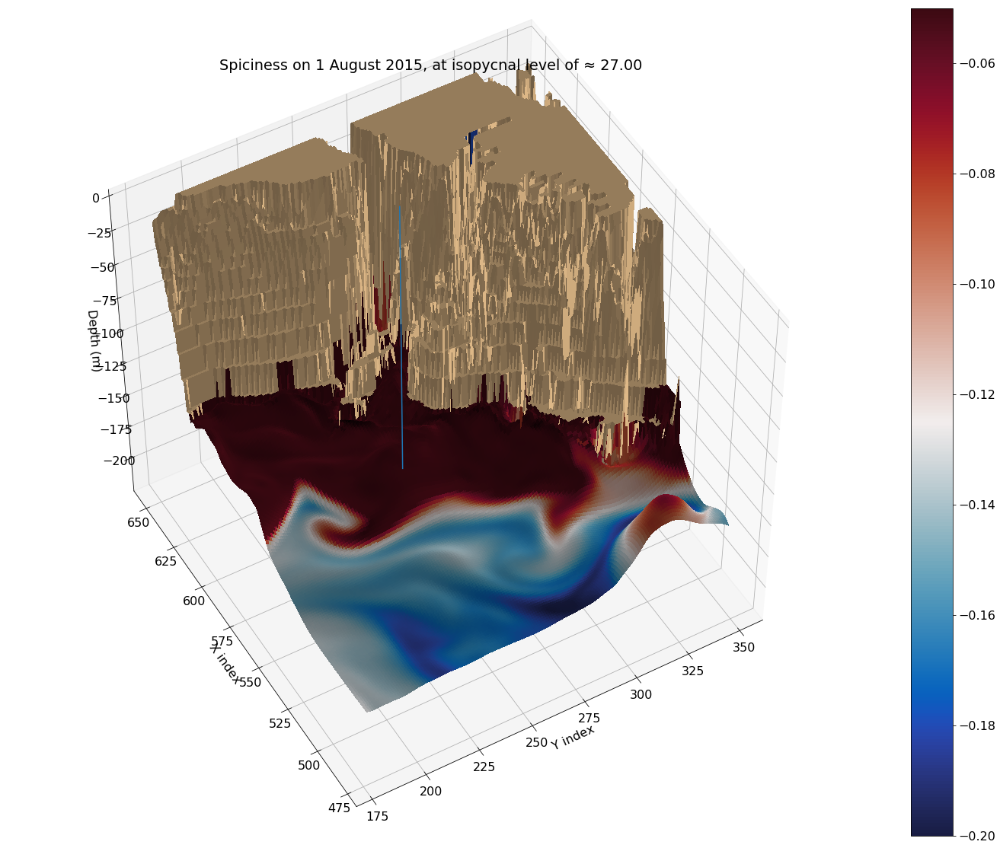

In [35]:
t= 0
rho_0 = 27

plot_iso_den(t, rho_0, 'August')

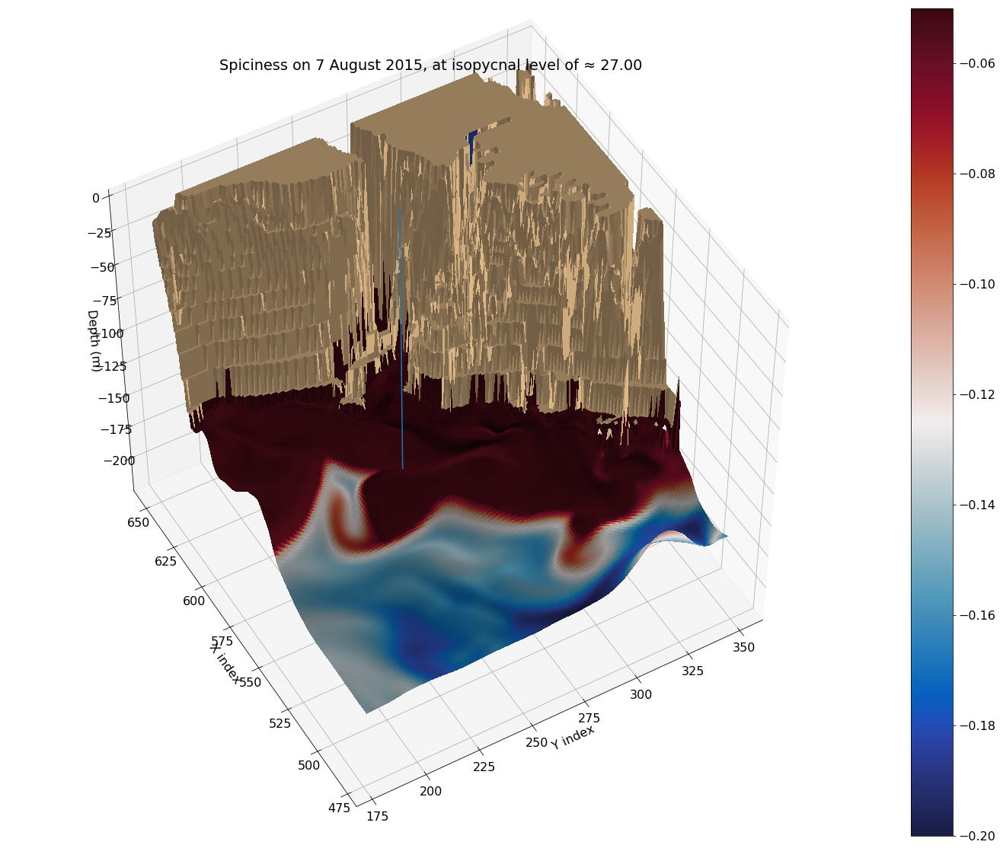

In [36]:
t= 6
rho_0 = 27

plot_iso_den(t, rho_0, 'August')

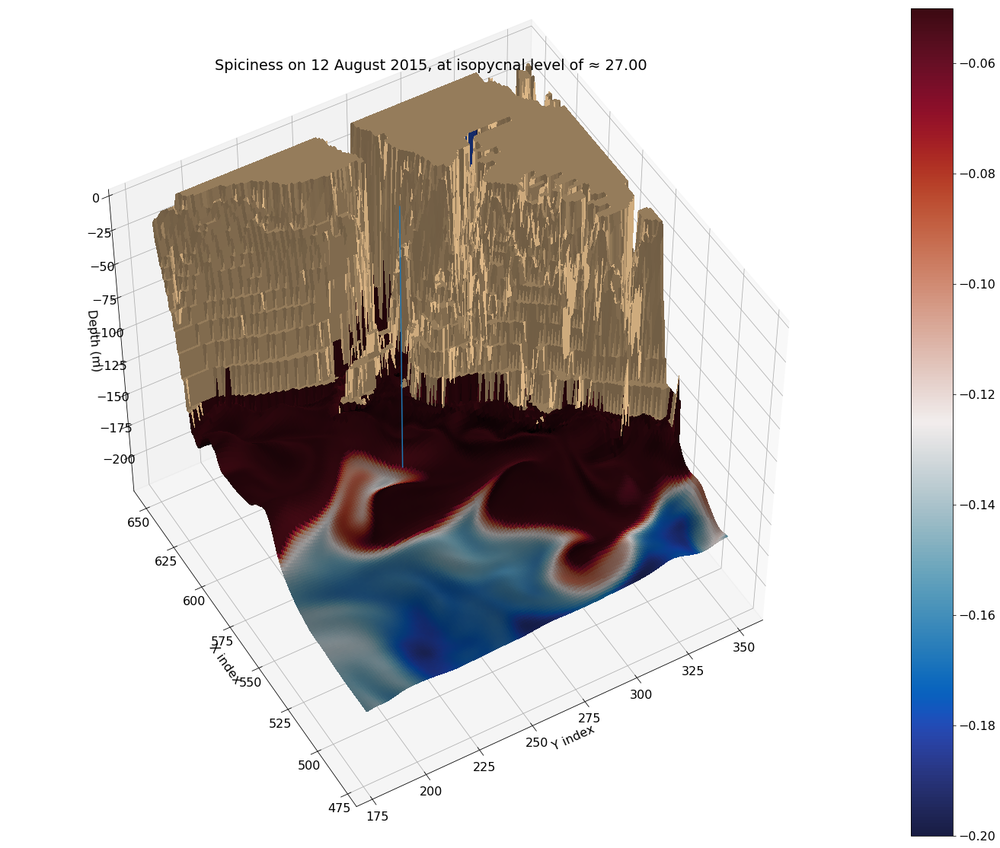

In [37]:
t= 11
rho_0 = 27

plot_iso_den(t, rho_0, 'August')

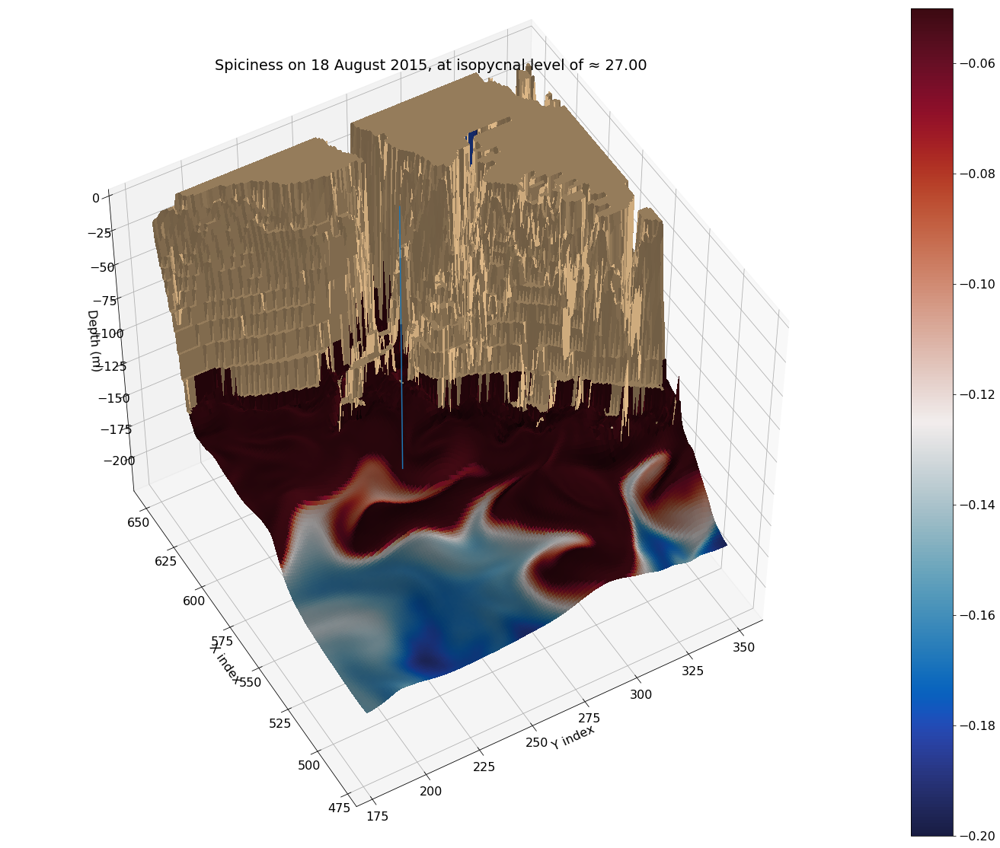

In [38]:
t= 17
rho_0 = 27

plot_iso_den(t, rho_0, 'August')

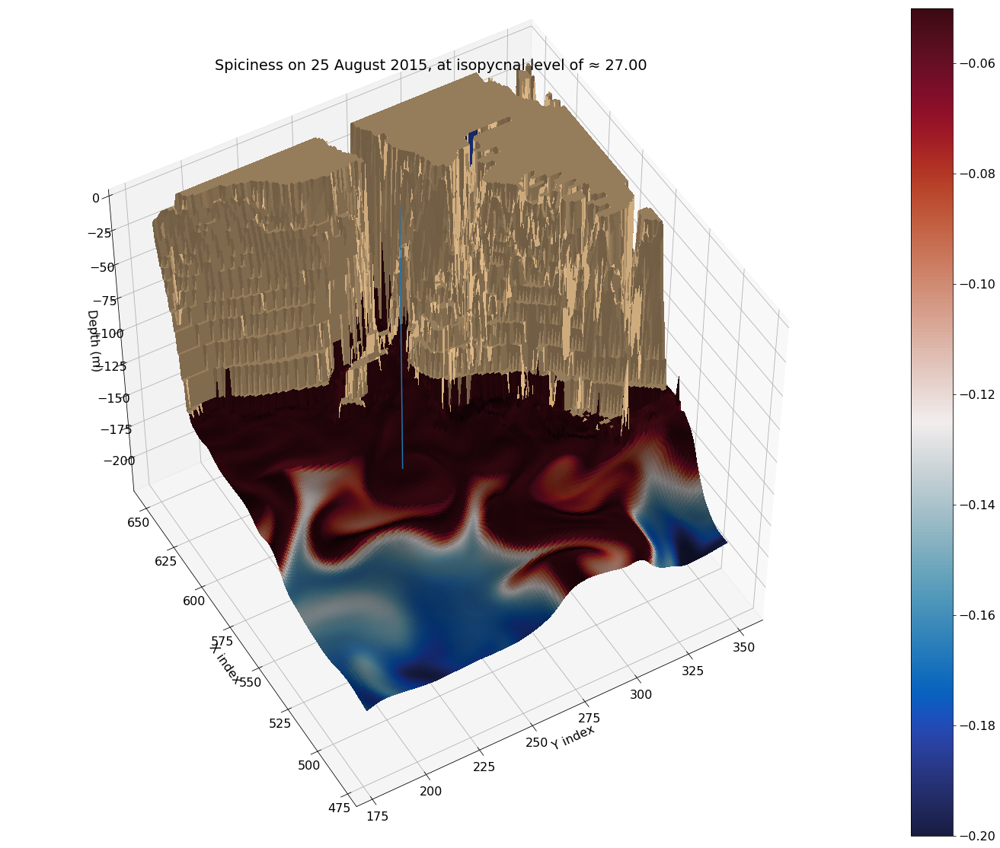

In [39]:
t= 24
rho_0 = 27

plot_iso_den(t, rho_0, 'August')

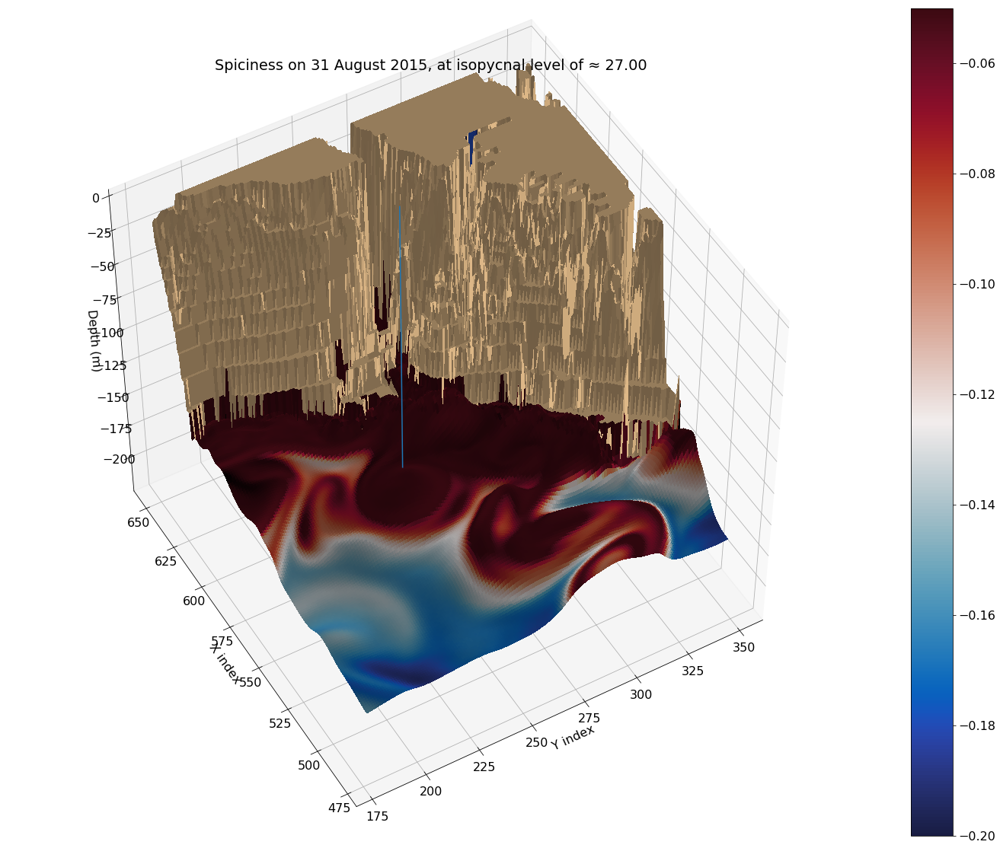

In [40]:
t= 30
rho_0 = 27

plot_iso_den(t, rho_0, 'August')

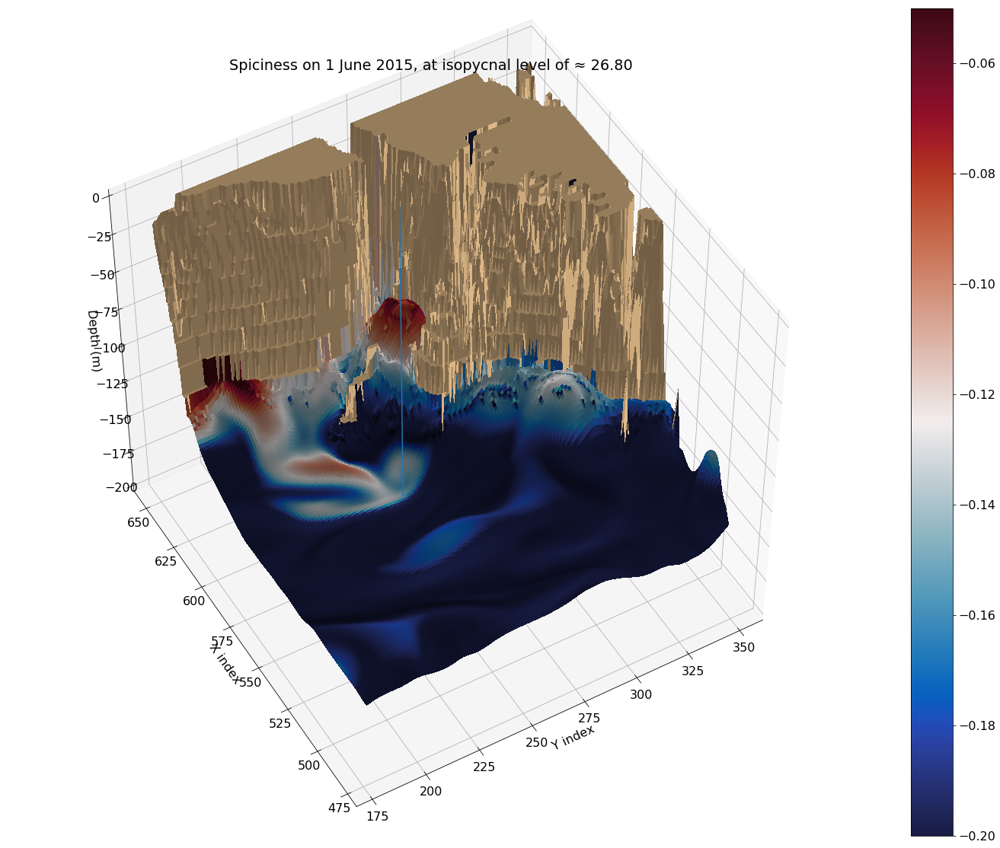

In [41]:
t= 0
rho_0 = 26.8

plot_iso_den(t, rho_0, 'June')

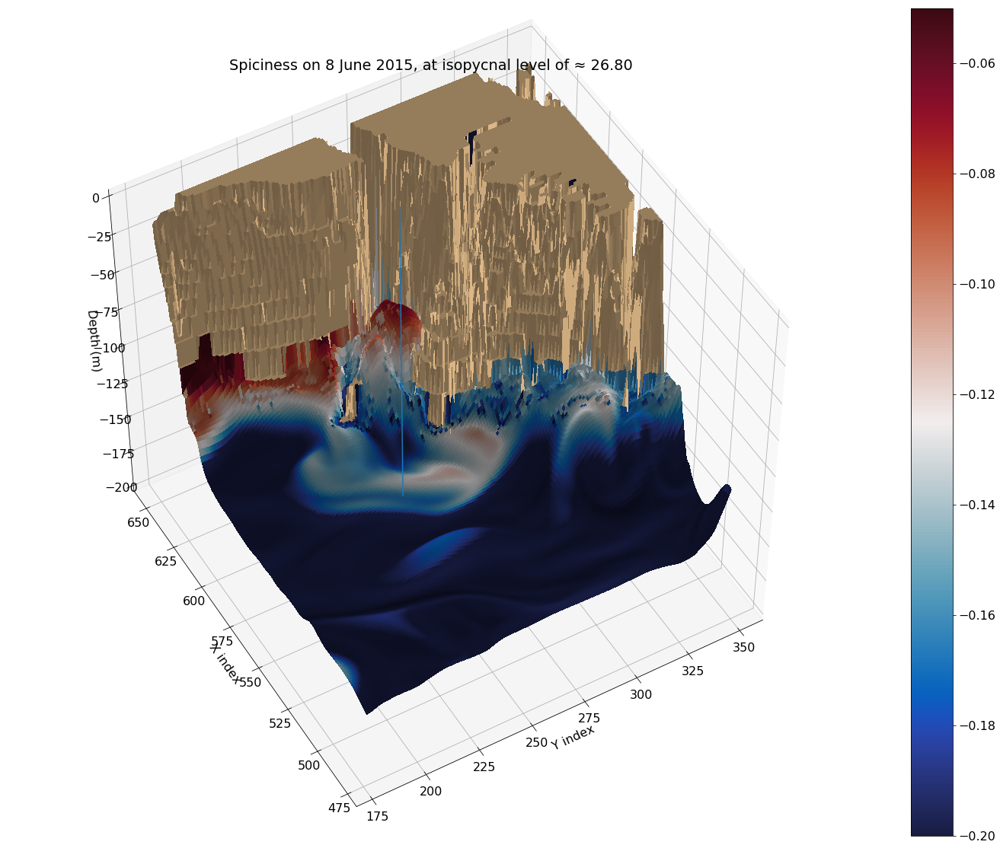

In [42]:
t= 7
rho_0 = 26.8

plot_iso_den(t, rho_0, 'June')

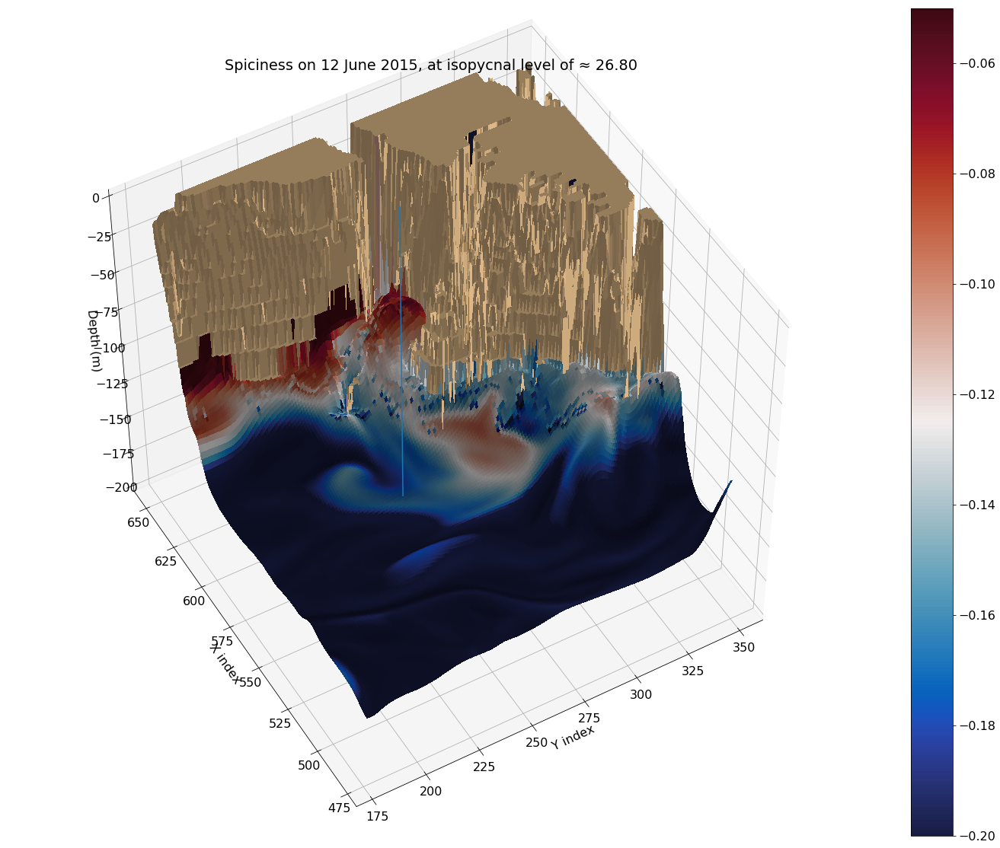

In [43]:
t= 11
rho_0 = 26.8

plot_iso_den(t, rho_0, 'June')

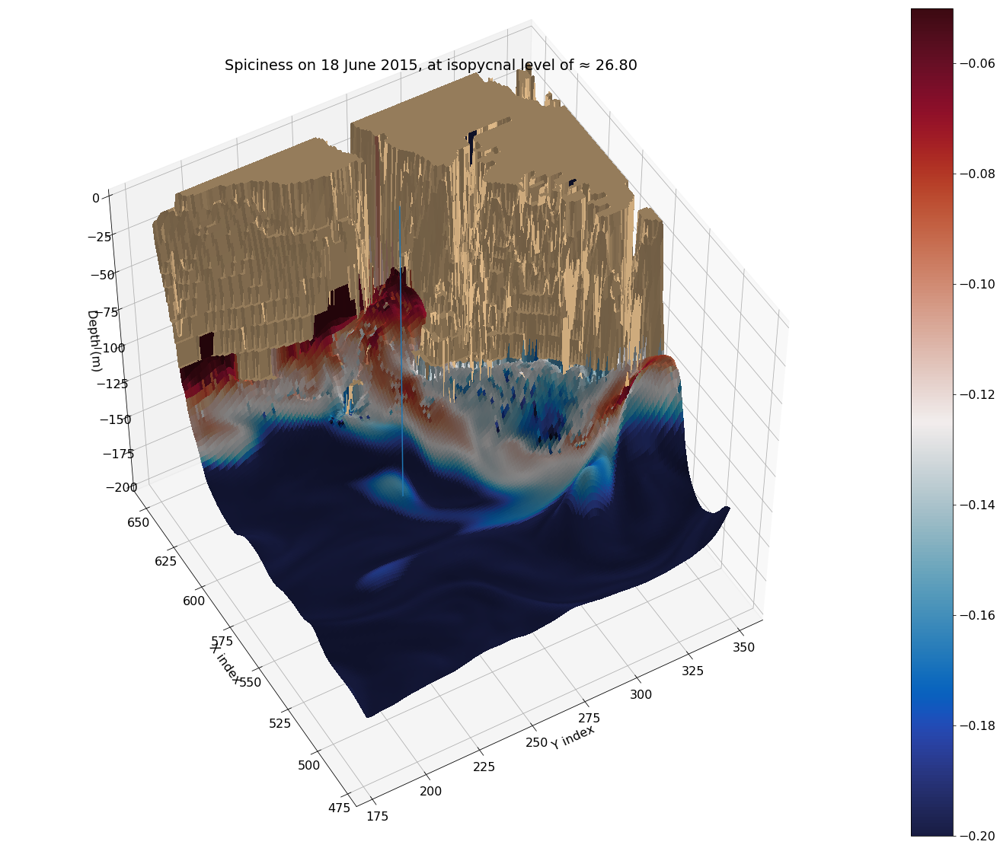

In [44]:
t= 17
rho_0 = 26.8

plot_iso_den(t, rho_0, 'June')

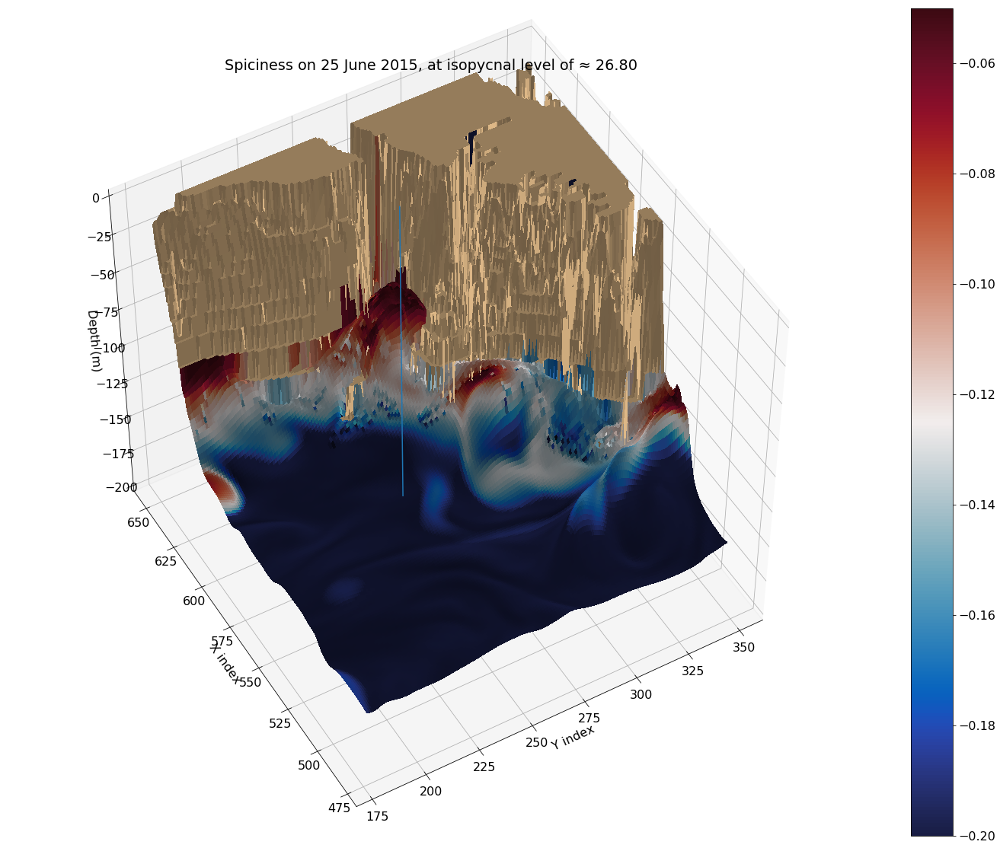

In [45]:
t= 24
rho_0 = 26.8

plot_iso_den(t, rho_0, 'June')

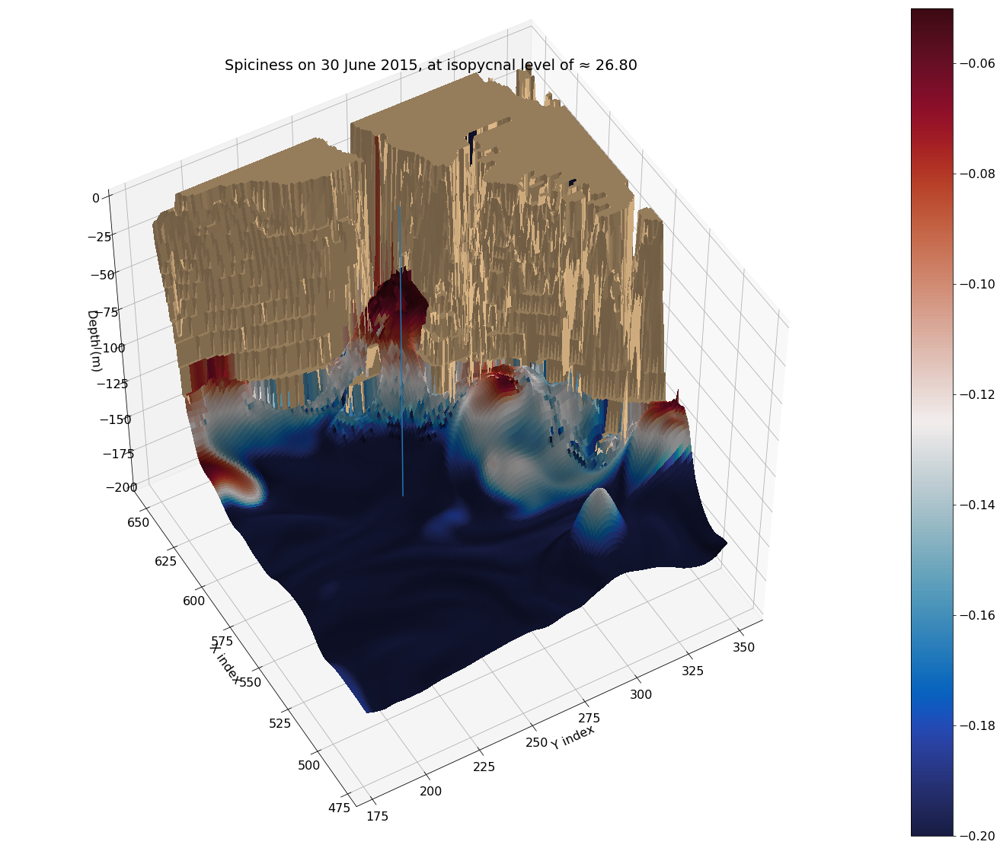

In [46]:
t= 29
rho_0 = 26.8

plot_iso_den(t, rho_0, 'June')

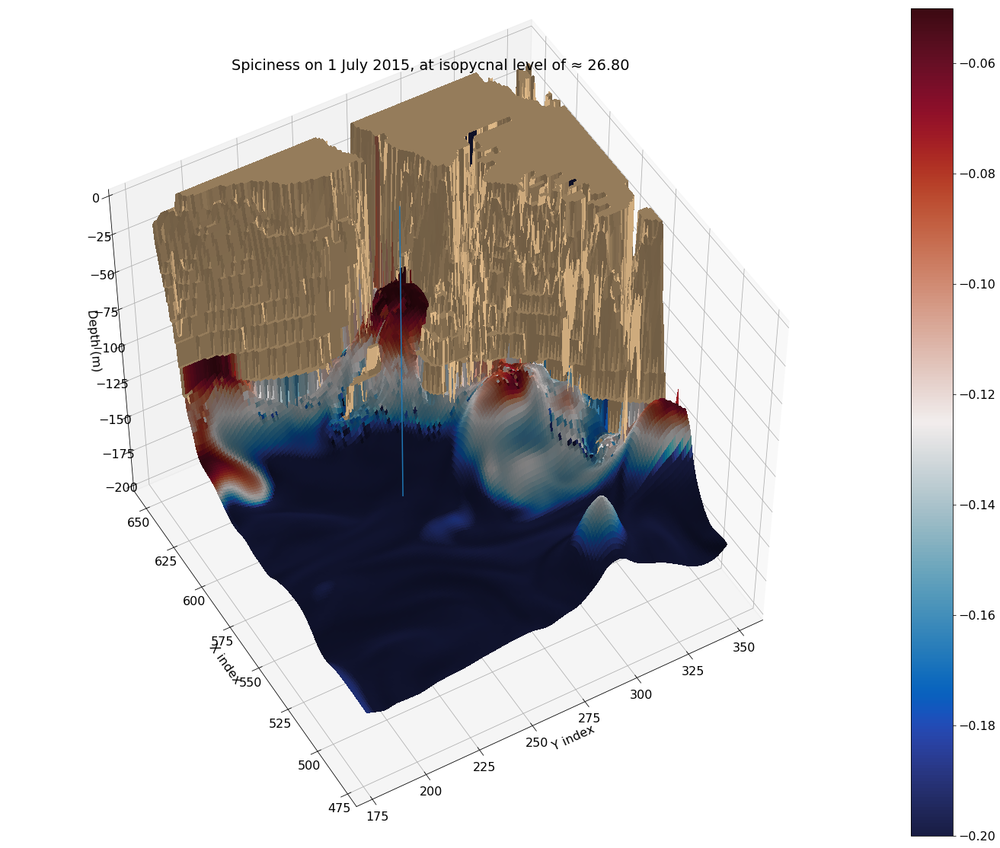

In [47]:
t= 0
rho_0 = 26.8

plot_iso_den(t, rho_0, 'July')

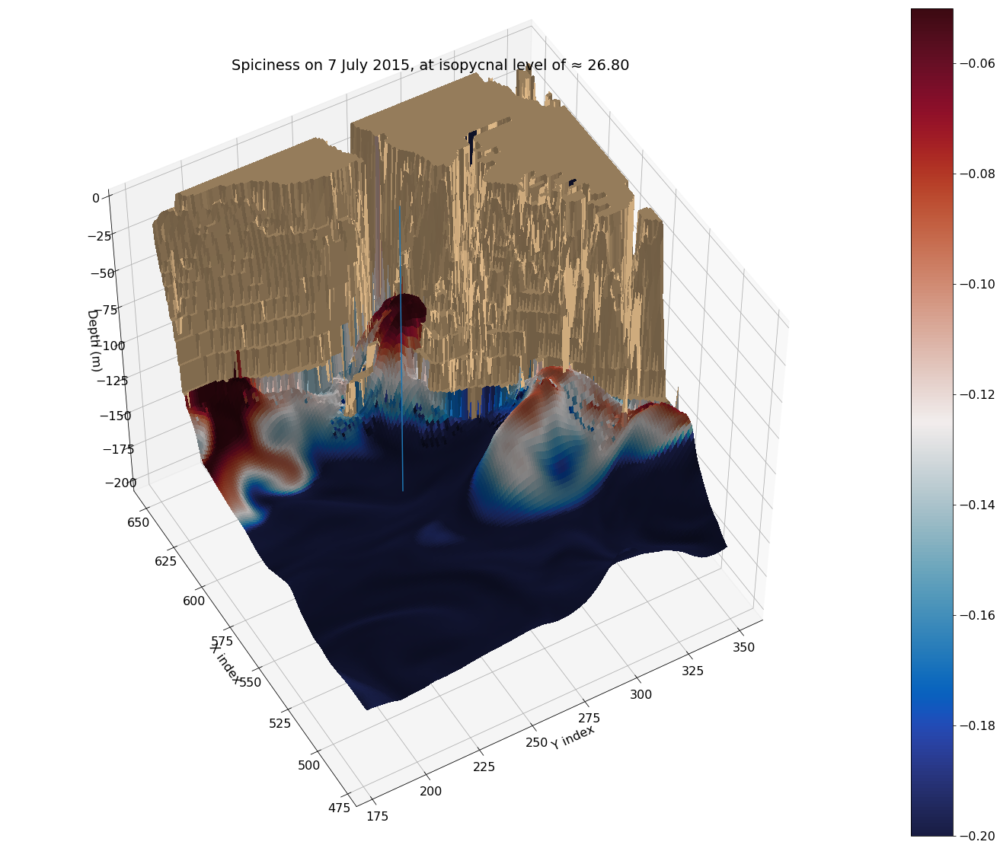

In [48]:
t= 6
rho_0 = 26.8

plot_iso_den(t, rho_0, 'July')

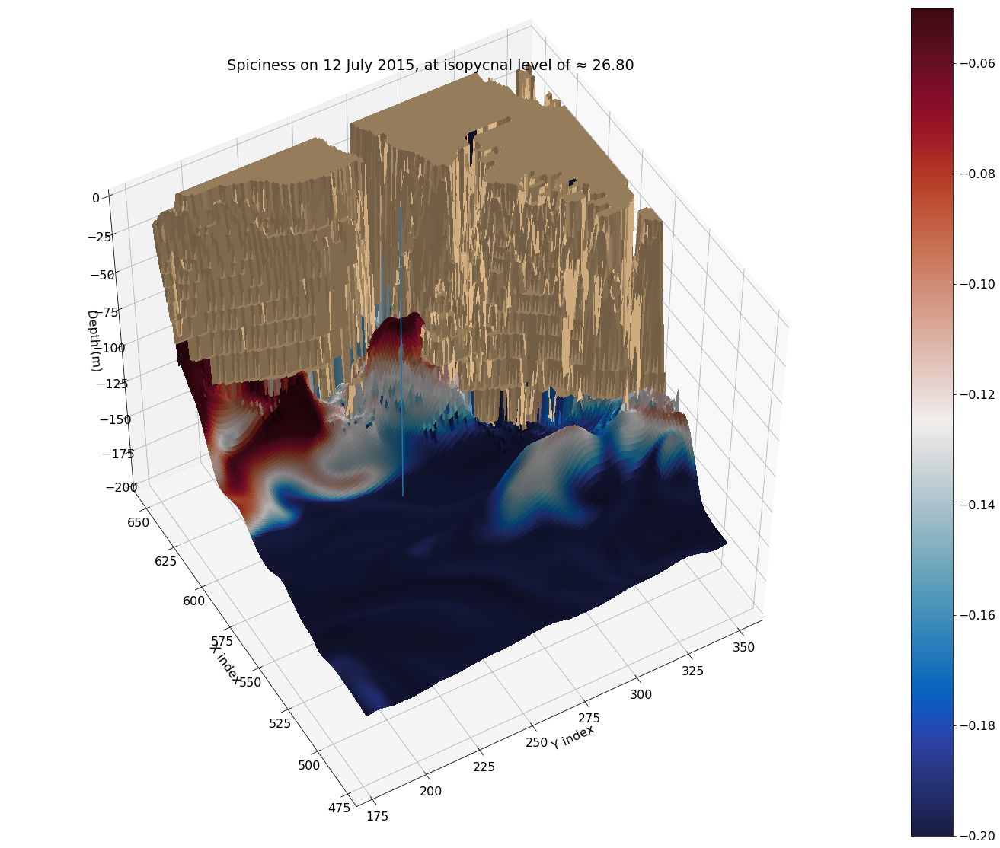

In [49]:
t= 11
rho_0 = 26.8

plot_iso_den(t, rho_0, 'July')

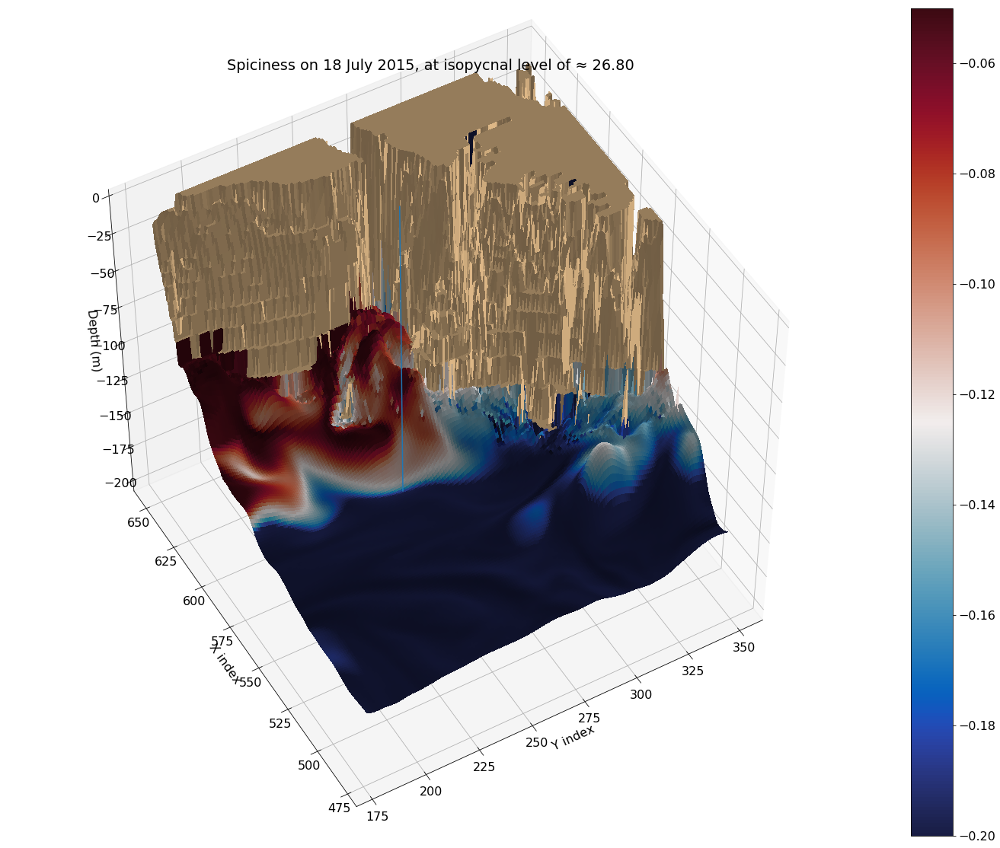

In [50]:
t= 17
rho_0 = 26.8

plot_iso_den(t, rho_0, 'July')

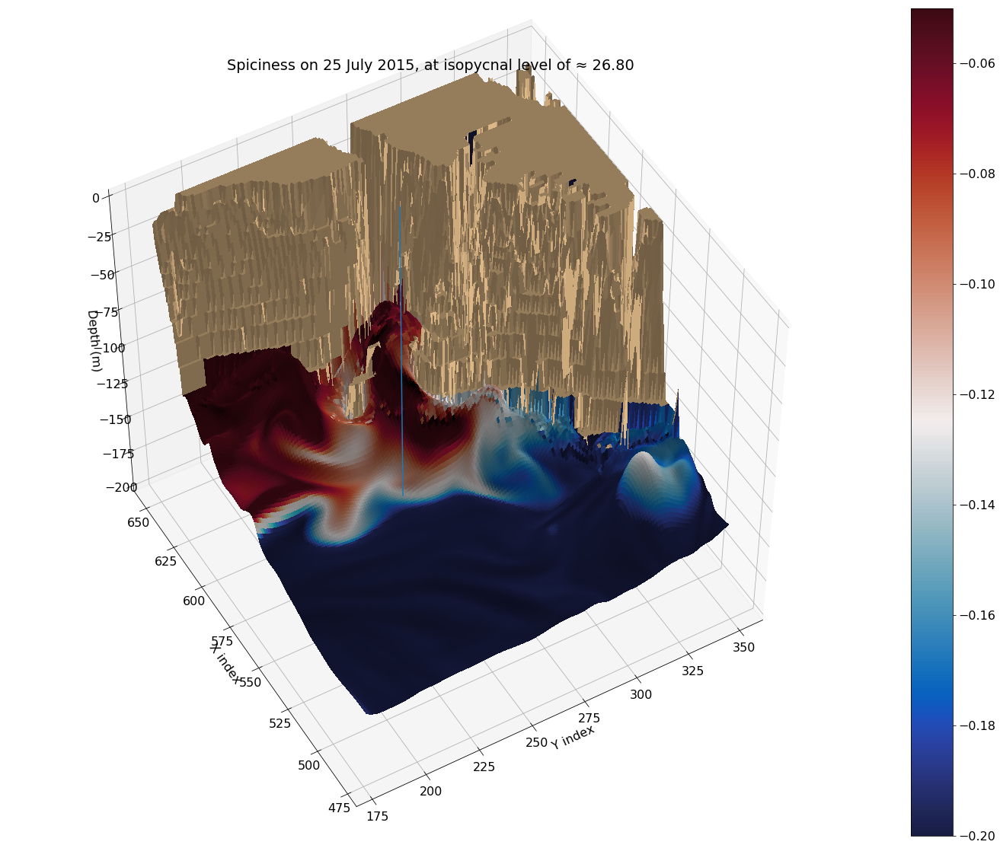

In [51]:
t= 24
rho_0 = 26.8

plot_iso_den(t, rho_0, 'July')

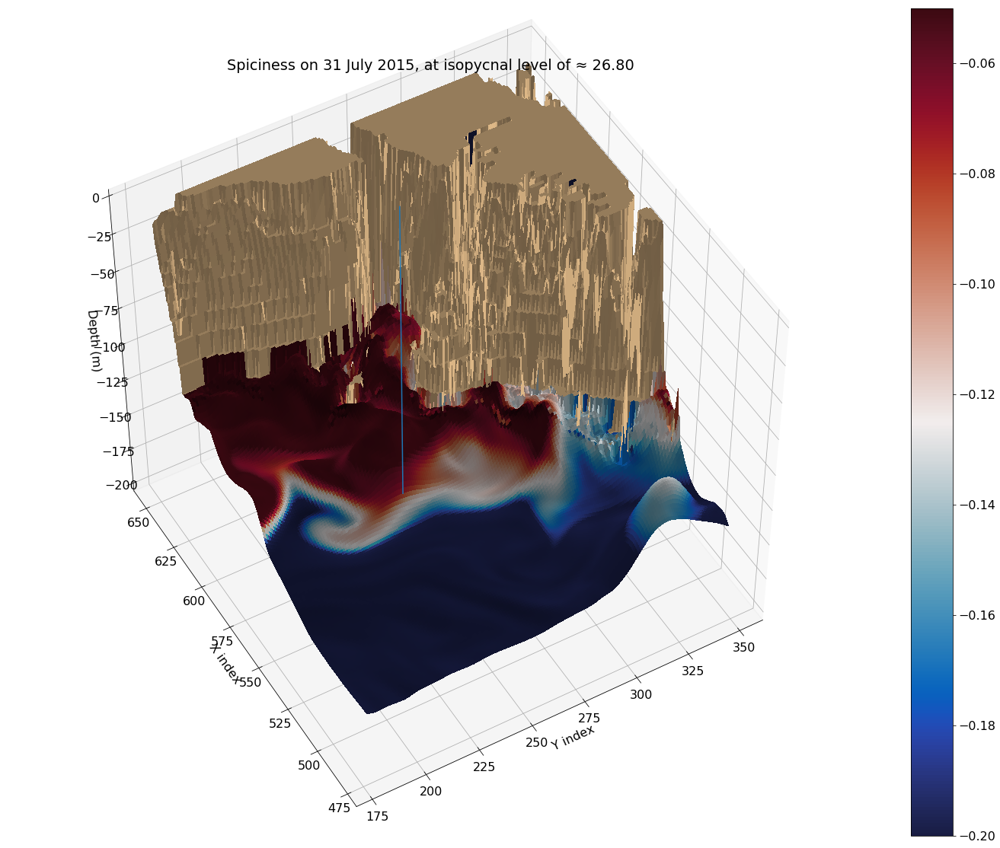

In [52]:
t= 30
rho_0 = 26.8

plot_iso_den(t, rho_0, 'July')

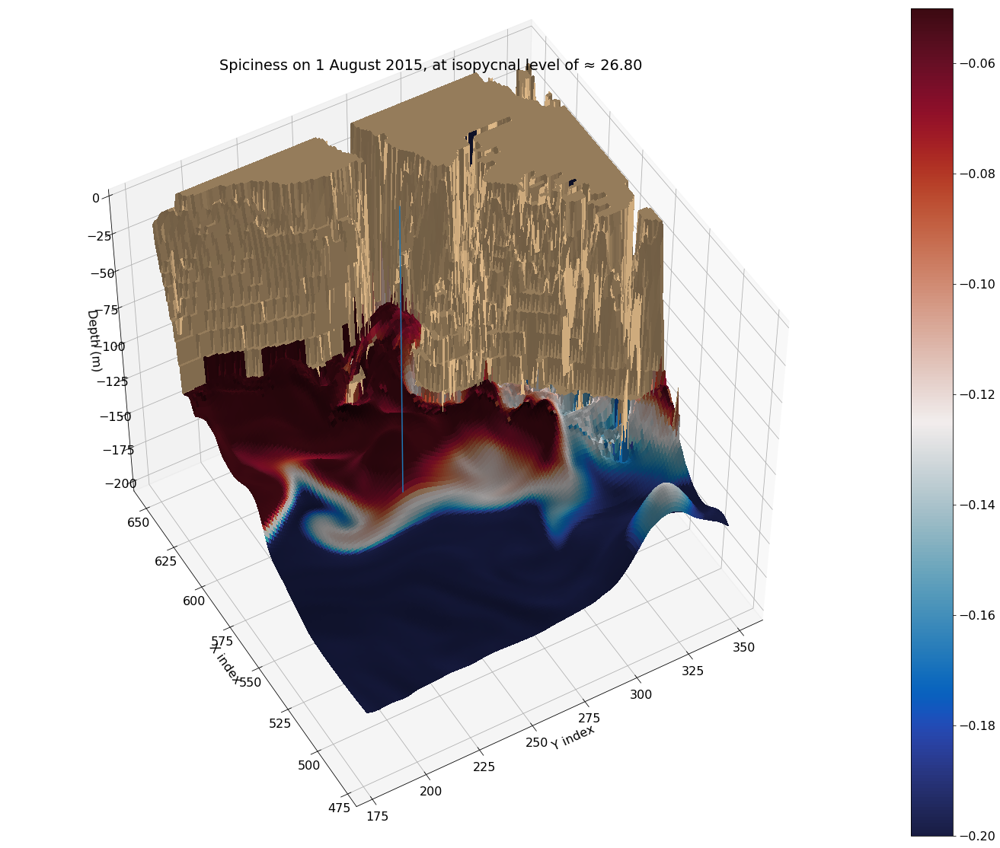

In [ ]:
t= 0
rho_0 = 26.8

plot_iso_den(t, rho_0, 'August')

In [ ]:
t= 6
rho_0 = 26.8

plot_iso_den(t, rho_0, 'August')

In [ ]:
t= 11
rho_0 = 26.8

plot_iso_den(t, rho_0, 'August')

In [ ]:
t= 17
rho_0 = 26.8

plot_iso_den(t, rho_0, 'August')

In [ ]:
t= 24
rho_0 = 26.8

plot_iso_den(t, rho_0, 'August')

In [ ]:
t= 30
rho_0 = 26.8

plot_iso_den(t, rho_0, 'August')

In [ ]:
t= 17
rho_0 = 26.8

plot_iso_den(t, rho_0, 'August')